In [474]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pandas_datareader.data as web
import quandl
from datetime import datetime
import requests
import time
import warnings
warnings.filterwarnings('ignore')

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import SGD,Adam
from keras.utils.np_utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, BatchNormalization
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.callbacks import ModelCheckpoint



import pygad
import pygad.kerasga


In [500]:
#parameters

FUTURE = 5
ROLLING = 5
ROLLING1 = 10
ROLLING2 = 15

In [501]:
#List of features

start = datetime(2005, 1,1)
end = datetime(2022,12,1)


inputs = [ 'NASDAQCOM', 
          'DEXJPUS', 'DEXUSEU', 'DEXCHUS', 'DEXUSAL', 'VIXCLS', 
          'DCOILWTICO']
fred_df = pd.DataFrame()

for i, name in enumerate(inputs):
    print(f'Series:{name}')
    if i == 0:
        fred_df = web.get_data_fred(name, start, end)
    else:
        _df = web.get_data_fred(name, start, end)
        fred_df = fred_df.join(_df, how = 'outer')
        

Series:NASDAQCOM
Series:DEXJPUS
Series:DEXUSEU
Series:DEXCHUS
Series:DEXUSAL
Series:VIXCLS
Series:DCOILWTICO


In [502]:
#Gold_NIFTY_Russell

gold = quandl.get("LBMA/GOLD", authtoken="kUWytaDzbhXbCX7PDzvg")
gold.index.name = 'DATE'
gold = gold[['USD (AM)']]
gold = gold.reset_index()

starttime = int(time.mktime(datetime(2005, 1,1).timetuple()))
endtime = int(time.mktime(datetime(2022, 12,1).timetuple()))
query_string = f'https://query1.finance.yahoo.com/v7/finance/download/^NSEI?period1={starttime}&period2={endtime}&interval=1d&events=history&includeAdjustedClose=true'
nifty = pd.read_csv(query_string)
nifty = nifty[['Date','Close' ]]
nifty.columns = ['DATE','NIFTY50' ]
nifty['DATE'] = pd.to_datetime(nifty['DATE'])

query_string = f'https://query1.finance.yahoo.com/v7/finance/download/^RUT?period1={starttime}&period2={endtime}&interval=1d&events=history&includeAdjustedClose=true'
russell = pd.read_csv(query_string)
russell = russell[['Date','Close' ]]
russell.columns = ['DATE','RUSSL' ]
russell['DATE'] = pd.to_datetime(russell['DATE'])

query_string = f'https://query1.finance.yahoo.com/v7/finance/download/^GSPC?period1={starttime}&period2={endtime}&interval=1d&events=history&includeAdjustedClose=true'
snp500 = pd.read_csv(query_string)
snp500 = snp500[['Date','Close' ]]
snp500.columns = ['DATE','SNP500' ]
snp500['DATE'] = pd.to_datetime(snp500['DATE'])


fred_df = fred_df.reset_index()



In [503]:
fred_df = pd.merge(pd.merge(fred_df, gold, on = 'DATE'), nifty, on = 'DATE')

In [504]:
fred_df = pd.merge(fred_df, snp500, on = 'DATE')

In [505]:
fred_df.isna().sum()

DATE           0
NASDAQCOM      0
DEXJPUS       39
DEXUSEU       39
DEXCHUS       39
DEXUSAL       39
VIXCLS         0
DCOILWTICO     7
USD (AM)       0
NIFTY50       10
SNP500         0
dtype: int64

In [506]:
fred_df


,DATE,NASDAQCOM,DEXJPUS,DEXUSEU,DEXCHUS,DEXUSAL,VIXCLS,DCOILWTICO,USD (AM),NIFTY50,SNP500
0,2007-09-17,2581.66,114.93,1.3860,7.5190,0.8328,26.48,80.55,710.25,4494.649902,1476.650024
1,2007-09-18,2651.66,115.75,1.3869,7.5220,0.8363,20.35,81.51,717.70,4546.200195,1519.780029
2,2007-09-19,2666.48,116.21,1.3950,7.5135,0.8555,20.03,81.99,723.75,4732.350098,1529.030029
3,2007-09-20,2654.29,114.18,1.4092,7.5055,0.8641,20.45,83.85,727.75,4747.549805,1518.750000
4,2007-09-21,2671.22,115.60,1.4076,7.5000,0.8650,19.00,83.38,735.35,4837.549805,1525.750000
...,...,...,...,...,...,...,...,...,...,...,...
3567,2022-11-23,11285.32,139.76,1.0364,7.1580,0.6707,20.35,77.93,1735.75,18267.250000,4027.260010
3568,2022-11-25,11226.36,139.21,1.0402,7.1642,0.6750,20.50,76.45,1753.55,18512.750000,4026.120117
3569,2022-11-28,11049.50,138.67,1.0386,7.2074,0.6694,22.21,77.10,1762.90,18562.750000,3963.939941
3570,2022-11-29,10983.78,138.28,1.0356,7.1568,0.6691,21.89,77.96,1755.35,18618.050781,3957.629883


In [507]:
fred_df

,DATE,NASDAQCOM,DEXJPUS,DEXUSEU,DEXCHUS,DEXUSAL,VIXCLS,DCOILWTICO,USD (AM),NIFTY50,SNP500
0,2007-09-17,2581.66,114.93,1.3860,7.5190,0.8328,26.48,80.55,710.25,4494.649902,1476.650024
1,2007-09-18,2651.66,115.75,1.3869,7.5220,0.8363,20.35,81.51,717.70,4546.200195,1519.780029
2,2007-09-19,2666.48,116.21,1.3950,7.5135,0.8555,20.03,81.99,723.75,4732.350098,1529.030029
3,2007-09-20,2654.29,114.18,1.4092,7.5055,0.8641,20.45,83.85,727.75,4747.549805,1518.750000
4,2007-09-21,2671.22,115.60,1.4076,7.5000,0.8650,19.00,83.38,735.35,4837.549805,1525.750000
...,...,...,...,...,...,...,...,...,...,...,...
3567,2022-11-23,11285.32,139.76,1.0364,7.1580,0.6707,20.35,77.93,1735.75,18267.250000,4027.260010
3568,2022-11-25,11226.36,139.21,1.0402,7.1642,0.6750,20.50,76.45,1753.55,18512.750000,4026.120117
3569,2022-11-28,11049.50,138.67,1.0386,7.2074,0.6694,22.21,77.10,1762.90,18562.750000,3963.939941
3570,2022-11-29,10983.78,138.28,1.0356,7.1568,0.6691,21.89,77.96,1755.35,18618.050781,3957.629883


In [508]:
fred_df['MONTH'] = fred_df['DATE'].dt.month
fred_df['DAY'] = fred_df['DATE'].dt.day

In [100]:
#fred_df.to_csv('fred_df.csv')

In [12]:
#fred_df = pd.read_csv('fred_df.csv', index_col= 'Unnamed: 0')

In [13]:
fred_df.columns = ['DATE', 'NASDAQCOM', 'DEXJPUS', 'DEXUSEU', 'DEXCHUS', 'DEXUSAL',
       'VIXCLS', 'DCOILWTICO', 'GOLD', 'NIFTY50', 'SNP500', 'MONTH',
       'DAY']

In [14]:
cols = ['NASDAQCOM', 'DEXJPUS', 'DEXUSEU', 'DEXCHUS', 'DEXUSAL',
       'VIXCLS', 'GOLD', 'NIFTY50', 'SNP500', 'DCOILWTICO']

In [15]:
fred_df.dropna(inplace = True)

In [16]:
for i in cols:
    col_name_roll = f'{i}_rolling_5'
    col_name_roll1 = f'{i}_rolling_10'
    col_name_roll2 = f'{i}_rolling_15'
    fred_df[col_name_roll] = fred_df[i].rolling(window = ROLLING).mean()
    fred_df[col_name_roll1] = fred_df[i].rolling(window = ROLLING1).mean()
    fred_df[col_name_roll2] = fred_df[i].rolling(window = ROLLING2).mean()

In [17]:
fred_df.isna().sum()

DATE                      0
NASDAQCOM                 0
DEXJPUS                   0
DEXUSEU                   0
DEXCHUS                   0
DEXUSAL                   0
VIXCLS                    0
DCOILWTICO                0
GOLD                      0
NIFTY50                   0
SNP500                    0
MONTH                     0
DAY                       0
NASDAQCOM_rolling_5       4
NASDAQCOM_rolling_10      9
NASDAQCOM_rolling_15     14
DEXJPUS_rolling_5         4
DEXJPUS_rolling_10        9
DEXJPUS_rolling_15       14
DEXUSEU_rolling_5         4
DEXUSEU_rolling_10        9
DEXUSEU_rolling_15       14
DEXCHUS_rolling_5         4
DEXCHUS_rolling_10        9
DEXCHUS_rolling_15       14
DEXUSAL_rolling_5         4
DEXUSAL_rolling_10        9
DEXUSAL_rolling_15       14
VIXCLS_rolling_5          4
VIXCLS_rolling_10         9
VIXCLS_rolling_15        14
GOLD_rolling_5            4
GOLD_rolling_10           9
GOLD_rolling_15          14
NIFTY50_rolling_5         4
NIFTY50_rolling_10  

In [18]:
fred_df.columns

Index(['DATE', 'NASDAQCOM', 'DEXJPUS', 'DEXUSEU', 'DEXCHUS', 'DEXUSAL',
       'VIXCLS', 'DCOILWTICO', 'GOLD', 'NIFTY50', 'SNP500', 'MONTH', 'DAY',
       'NASDAQCOM_rolling_5', 'NASDAQCOM_rolling_10', 'NASDAQCOM_rolling_15',
       'DEXJPUS_rolling_5', 'DEXJPUS_rolling_10', 'DEXJPUS_rolling_15',
       'DEXUSEU_rolling_5', 'DEXUSEU_rolling_10', 'DEXUSEU_rolling_15',
       'DEXCHUS_rolling_5', 'DEXCHUS_rolling_10', 'DEXCHUS_rolling_15',
       'DEXUSAL_rolling_5', 'DEXUSAL_rolling_10', 'DEXUSAL_rolling_15',
       'VIXCLS_rolling_5', 'VIXCLS_rolling_10', 'VIXCLS_rolling_15',
       'GOLD_rolling_5', 'GOLD_rolling_10', 'GOLD_rolling_15',
       'NIFTY50_rolling_5', 'NIFTY50_rolling_10', 'NIFTY50_rolling_15',
       'SNP500_rolling_5', 'SNP500_rolling_10', 'SNP500_rolling_15',
       'DCOILWTICO_rolling_5', 'DCOILWTICO_rolling_10',
       'DCOILWTICO_rolling_15'],
      dtype='object')

In [19]:
months = pd.get_dummies(fred_df['MONTH'], drop_first=True)
months.columns = ['FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']

day = pd.get_dummies(fred_df['DAY'], drop_first=True)

fred_df = pd.concat([fred_df, months, day], axis = 1)

In [20]:
fred_df['OIL_PRICE_FUTURE'] = fred_df['DCOILWTICO'].shift(-FUTURE)

In [21]:
fred_df

,DATE,NASDAQCOM,DEXJPUS,DEXUSEU,DEXCHUS,DEXUSAL,VIXCLS,DCOILWTICO,GOLD,NIFTY50,...,23,24,25,26,27,28,29,30,31,OIL_PRICE_FUTURE
0,2007-09-17,2581.66,114.93,1.3860,7.5190,0.8328,26.48,80.55,710.25,4494.649902,...,0,0,0,0,0,0,0,0,0,82.51
1,2007-09-18,2651.66,115.75,1.3869,7.5220,0.8363,20.35,81.51,717.70,4546.200195,...,0,0,0,0,0,0,0,0,0,81.20
2,2007-09-19,2666.48,116.21,1.3950,7.5135,0.8555,20.03,81.99,723.75,4732.350098,...,0,0,0,0,0,0,0,0,0,80.31
3,2007-09-20,2654.29,114.18,1.4092,7.5055,0.8641,20.45,83.85,727.75,4747.549805,...,0,0,0,0,0,0,0,0,0,82.86
4,2007-09-21,2671.22,115.60,1.4076,7.5000,0.8650,19.00,83.38,735.35,4837.549805,...,0,0,0,0,0,0,0,0,0,81.64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3567,2022-11-23,11285.32,139.76,1.0364,7.1580,0.6707,20.35,77.93,1735.75,18267.250000,...,1,0,0,0,0,0,0,0,0,NaN
3568,2022-11-25,11226.36,139.21,1.0402,7.1642,0.6750,20.50,76.45,1753.55,18512.750000,...,0,0,1,0,0,0,0,0,0,NaN
3569,2022-11-28,11049.50,138.67,1.0386,7.2074,0.6694,22.21,77.10,1762.90,18562.750000,...,0,0,0,0,0,1,0,0,0,NaN
3570,2022-11-29,10983.78,138.28,1.0356,7.1568,0.6691,21.89,77.96,1755.35,18618.050781,...,0,0,0,0,0,0,1,0,0,NaN


In [22]:
del fred_df['DAY']
del fred_df['MONTH']

In [23]:
cols = ['NASDAQCOM',
                     'DEXJPUS',               'DEXUSEU',
                     'DEXCHUS',               'DEXUSAL',
                      'VIXCLS',            'DCOILWTICO',
                        'GOLD',               'NIFTY50',
                      'SNP500',   'NASDAQCOM_rolling_5',
        'NASDAQCOM_rolling_10',  'NASDAQCOM_rolling_15',
           'DEXJPUS_rolling_5',    'DEXJPUS_rolling_10',
          'DEXJPUS_rolling_15',     'DEXUSEU_rolling_5',
          'DEXUSEU_rolling_10',    'DEXUSEU_rolling_15',
           'DEXCHUS_rolling_5',    'DEXCHUS_rolling_10',
          'DEXCHUS_rolling_15',     'DEXUSAL_rolling_5',
          'DEXUSAL_rolling_10',    'DEXUSAL_rolling_15',
            'VIXCLS_rolling_5',     'VIXCLS_rolling_10',
           'VIXCLS_rolling_15',        'GOLD_rolling_5',
             'GOLD_rolling_10',       'GOLD_rolling_15',
           'NIFTY50_rolling_5',    'NIFTY50_rolling_10',
          'NIFTY50_rolling_15',      'SNP500_rolling_5',
           'SNP500_rolling_10',     'SNP500_rolling_15',
        'DCOILWTICO_rolling_5', 'DCOILWTICO_rolling_10',
       'DCOILWTICO_rolling_15']

In [24]:
minmaxscaler = MinMaxScaler()

fred_df[cols] = minmaxscaler.fit_transform(fred_df.loc[:, fred_df.columns.isin(cols)])

In [25]:
fred_df.dropna(inplace = True)

In [26]:
fred_df.drop(columns='DATE', inplace = True)

In [27]:
fred_df = fred_df.reset_index()
del fred_df['index']

In [28]:
fred_df

,NASDAQCOM,DEXJPUS,DEXUSEU,DEXCHUS,DEXUSAL,VIXCLS,DCOILWTICO,GOLD,NIFTY50,SNP500,...,23,24,25,26,27,28,29,30,31,OIL_PRICE_FUTURE
0,0.103139,0.554791,0.709728,0.991767,0.615253,0.113120,0.636074,0.032140,0.157748,0.212788,...,0,0,0,0,0,0,0,0,0,86.19
1,0.104262,0.556815,0.700031,0.991564,0.610890,0.094901,0.642986,0.026516,0.172664,0.215841,...,0,0,0,0,0,0,0,0,0,87.58
2,0.104785,0.559379,0.710197,0.990215,0.614115,0.102379,0.648856,0.035062,0.179698,0.215190,...,0,0,0,0,0,0,0,0,0,87.19
3,0.102109,0.566667,0.721301,0.990552,0.623791,0.132427,0.658456,0.040175,0.184836,0.213232,...,0,0,0,0,0,0,0,0,0,89.48
4,0.104383,0.563833,0.711917,0.991227,0.623601,0.116791,0.662187,0.040906,0.178885,0.215027,...,0,0,0,0,0,0,0,0,0,88.58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3495,0.673343,0.861943,0.121833,0.712782,0.185544,0.203535,0.672555,0.796713,0.978521,0.797244,...,0,0,0,0,0,0,0,0,0,77.93
3496,0.670715,0.873549,0.113388,0.752396,0.172832,0.201088,0.650996,0.783090,0.974471,0.794273,...,0,0,0,0,0,0,0,0,0,76.45
3497,0.670789,0.867881,0.114639,0.728168,0.175678,0.190075,0.642109,0.783236,0.972238,0.798835,...,0,0,0,0,0,0,0,0,0,77.10
3498,0.662535,0.893792,0.097279,0.758402,0.158414,0.179742,0.640298,0.764901,0.963139,0.795094,...,0,0,0,0,0,0,0,0,0,77.96


In [29]:
thres_hold = int(-0.10*(fred_df.shape[0]))

training_dataset = fred_df.iloc[:thres_hold, :]
test_dataset = fred_df.iloc[thres_hold:, :]

In [30]:
y_train = np.array(training_dataset['OIL_PRICE_FUTURE'].values)
y_test = np.array(test_dataset['OIL_PRICE_FUTURE'].values)

X_train = training_dataset.loc[:, training_dataset.columns != 'OIL_PRICE_FUTURE']
X_test = test_dataset.loc[:, test_dataset.columns != 'OIL_PRICE_FUTURE']

X_train_arr = np.array(X_train)
X_test_arr = np.array(X_test)


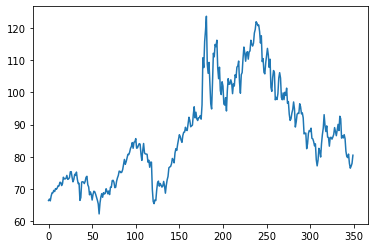

In [60]:
plt.plot(y_test)

In [62]:
model_nn = Sequential()
model_nn.add(Dense(128, activation = 'sigmoid',input_shape = (X_train.shape[1],)))
model_nn.add(Dropout(0.2))
model_nn.add(BatchNormalization())
model_nn.add(Dense(128, activation = 'relu'))
model_nn.add(Dense(128, activation = 'relu'))
model_nn.add(Dense(1, activation='relu'))

opt = Adam()

model_nn.compile(optimizer=opt,  loss='mean_squared_error', metrics='mean_squared_error')



In [64]:
history_nn = model_nn.fit(X_train_arr, y_train, epochs = 50, 
             validation_data = [X_test_arr, y_test])


Epoch 1/50
 1/99 [..............................] - ETA: 24s - loss: 5707.5820 - mean_squared_error: 5707.5820

2022-12-08 12:47:25.895447: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


99/99 [==============================] - 1s 9ms/step - loss: 1593.0588 - mean_squared_error: 1593.0588 - val_loss: 506.7443 - val_mean_squared_error: 506.7443
Epoch 2/50
10/99 [==>...........................] - ETA: 0s - loss: 375.2274 - mean_squared_error: 375.2274

2022-12-08 12:47:26.842667: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


99/99 [==============================] - 1s 6ms/step - loss: 310.4996 - mean_squared_error: 310.4996 - val_loss: 1560.5497 - val_mean_squared_error: 1560.5497
Epoch 3/50
99/99 [==============================] - 1s 6ms/step - loss: 181.0571 - mean_squared_error: 181.0571 - val_loss: 2365.4963 - val_mean_squared_error: 2365.4963
Epoch 4/50
99/99 [==============================] - 1s 6ms/step - loss: 143.3135 - mean_squared_error: 143.3135 - val_loss: 2467.3264 - val_mean_squared_error: 2467.3264
Epoch 5/50
99/99 [==============================] - 1s 6ms/step - loss: 123.0720 - mean_squared_error: 123.0720 - val_loss: 2425.4399 - val_mean_squared_error: 2425.4399
Epoch 6/50
99/99 [==============================] - 1s 6ms/step - loss: 107.2480 - mean_squared_error: 107.2480 - val_loss: 2120.1809 - val_mean_squared_error: 2120.1807
Epoch 7/50
99/99 [==============================] - 1s 6ms/step - loss: 93.3354 - mean_squared_error: 93.3354 - val_loss: 1849.6232 - val_mean_squared_error: 184

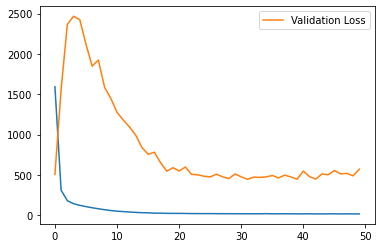

In [65]:
plt.plot(history_nn.history['loss'])
plt.plot(history_nn.history['val_loss'], label = 'Validation Loss')
plt.legend()

In [75]:
ynew_nn_train = model_nn.predict(X_train)
ynew_nn_test = model_nn.predict(X_test_arr)


2022-12-08 12:50:46.408415: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


In [67]:
#LSTM Model

In [83]:
model_lstm = Sequential()

model_lstm.add(LSTM(128, input_shape=(X_train.shape[1],1), return_sequences=True))
model_lstm.add(Dropout(0.2))
model_lstm.add(BatchNormalization())  #normalizes activation outputs, same reason you want to normalize your input data.

model_lstm.add(LSTM(128, return_sequences=True))
model_lstm.add(Dropout(0.1))
model_lstm.add(BatchNormalization())

model_lstm.add(LSTM(128))
model_lstm.add(Dropout(0.2))
model_lstm.add(BatchNormalization())

model_lstm.add(Dense(32, activation='relu'))
model_lstm.add(Dropout(0.2))

model_lstm.add(Dense(1, activation='relu'))

opt = tf.keras.optimizers.Adam(lr=0.001, decay=1e-6)

# Compile model
model_lstm.compile(
    loss='mean_squared_error',
    optimizer=opt,
    metrics=['mean_squared_error']
)

In [84]:
history1 = model_lstm.fit(
        X_train, y_train,
    batch_size=32,
    epochs=50,
    validation_data=(X_test, y_test),
)


Epoch 1/50


2022-12-08 12:52:48.295498: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:52:48.773862: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:52:48.918696: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:52:49.068744: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:52:49.304282: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:52:49.561802: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:52:49.813176: I tensorflow/core/grappler/optimizers/cust

99/99 [==============================] - ETA: 0s - loss: 4230.4355 - mean_squared_error: 4230.4355

2022-12-08 12:52:57.590453: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:52:57.721704: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:52:57.828778: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:52:57.938292: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


99/99 [==============================] - 11s 88ms/step - loss: 4230.4355 - mean_squared_error: 4230.4355 - val_loss: 4205.9863 - val_mean_squared_error: 4205.9863
Epoch 2/50
99/99 [==============================] - 6s 63ms/step - loss: 2726.0366 - mean_squared_error: 2726.0366 - val_loss: 976.9995 - val_mean_squared_error: 976.9995
Epoch 3/50
99/99 [==============================] - 6s 63ms/step - loss: 1749.7466 - mean_squared_error: 1749.7466 - val_loss: 494.2462 - val_mean_squared_error: 494.2462
Epoch 4/50
99/99 [==============================] - 6s 63ms/step - loss: 1704.6195 - mean_squared_error: 1704.6195 - val_loss: 584.8573 - val_mean_squared_error: 584.8573
Epoch 5/50
99/99 [==============================] - 6s 63ms/step - loss: 1666.7882 - mean_squared_error: 1666.7882 - val_loss: 360.2236 - val_mean_squared_error: 360.2236
Epoch 6/50
99/99 [==============================] - 6s 63ms/step - loss: 1684.0891 - mean_squared_error: 1684.0891 - val_loss: 874.7658 - val_mean_square

Epoch 49/50
99/99 [==============================] - 6s 66ms/step - loss: 48.6717 - mean_squared_error: 48.6717 - val_loss: 906.2958 - val_mean_squared_error: 906.2958
Epoch 50/50
99/99 [==============================] - 7s 66ms/step - loss: 52.5867 - mean_squared_error: 52.5867 - val_loss: 710.5558 - val_mean_squared_error: 710.5558


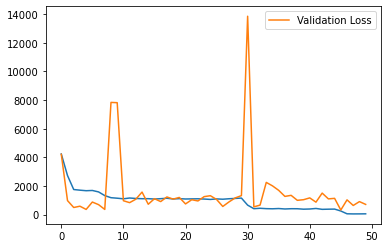

In [85]:
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'], label = 'Validation Loss')
plt.legend()

In [86]:
ynew1_train = model_lstm.predict(X_train)
ynew1_test = model_lstm.predict(X_test_arr)

2022-12-08 12:58:11.255975: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:58:11.398876: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:58:11.526574: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:58:11.661074: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:58:15.308038: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:58:15.451688: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 12:58:15.557328: I tensorflow/core/grappler/optimizers/cust

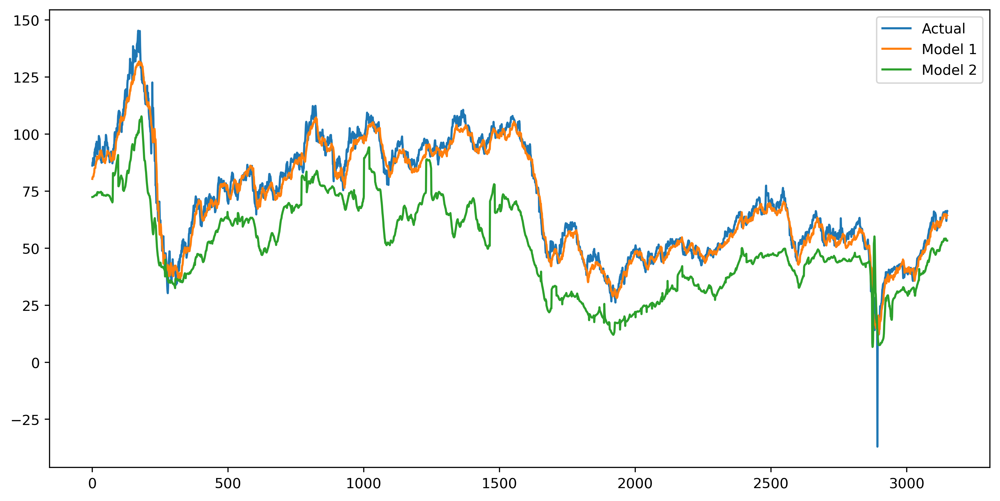

In [87]:
plt.figure(figsize = (12,6), dpi = 400)
plt.plot(y_train, label = 'Actual')
plt.plot(ynew_nn_train, label = 'Model 1')
plt.plot(ynew1_train, label = 'Model 2')
plt.legend()

(20.0, 150.0)

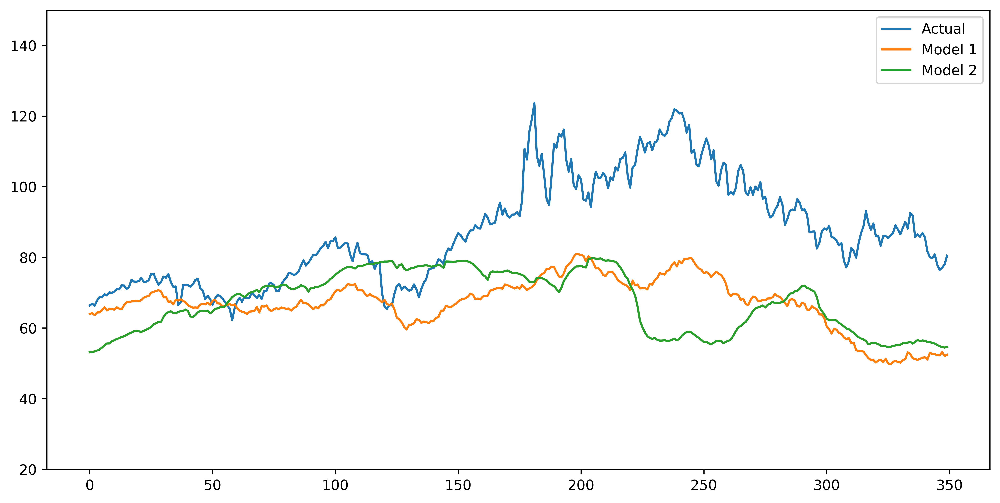

In [89]:

plt.figure(figsize = (12,6), dpi = 600)

plt.plot(y_test, label = 'Actual')
plt.plot(ynew_nn_test, label = 'Model 1')
plt.plot(ynew1_test, label = 'Model 2')
plt.legend()
plt.ylim(20, 150)

In [90]:
#Without CoVID

In [484]:
#fred_df= pd.read_csv('fred_df.csv', index_col= 'Unnamed: 0')

In [509]:
fred_df.columns = ['DATE', 'NASDAQCOM', 'DEXJPUS', 'DEXUSEU', 'DEXCHUS', 'DEXUSAL',
       'VIXCLS', 'DCOILWTICO', 'GOLD', 'NIFTY50', 'SNP500', 'MONTH',
       'DAY']

cols = ['NASDAQCOM', 'DEXJPUS', 'DEXUSEU', 'DEXCHUS', 'DEXUSAL',
       'VIXCLS', 'GOLD', 'NIFTY50', 'SNP500', 'DCOILWTICO']

fred_df.dropna(inplace = True)

for i in cols:
    col_name_roll = f'{i}_rolling_5'
    col_name_roll1 = f'{i}_rolling_10'
    col_name_roll2 = f'{i}_rolling_15'
    fred_df[col_name_roll] = fred_df[i].rolling(window = ROLLING).mean()
    fred_df[col_name_roll1] = fred_df[i].rolling(window = ROLLING1).mean()
    fred_df[col_name_roll2] = fred_df[i].rolling(window = ROLLING2).mean()
    
months = pd.get_dummies(fred_df['MONTH'], drop_first=True)
months.columns = ['FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']

day = pd.get_dummies(fred_df['DAY'], drop_first=True)

fred_df = pd.concat([fred_df, months, day], axis = 1)

In [510]:
fred_df = fred_df[fred_df['DATE'] <= datetime(2020,3,1)]

In [511]:
fred_df['OIL_PRICE_FUTURE'] = fred_df['DCOILWTICO'].shift(-FUTURE)

In [512]:
del fred_df['DAY']
del fred_df['MONTH']

In [513]:
cols = ['NASDAQCOM',
                     'DEXJPUS',               'DEXUSEU',
                     'DEXCHUS',               'DEXUSAL',
                      'VIXCLS',            'DCOILWTICO',
                        'GOLD',               'NIFTY50',
                      'SNP500',   'NASDAQCOM_rolling_5',
        'NASDAQCOM_rolling_10',  'NASDAQCOM_rolling_15',
           'DEXJPUS_rolling_5',    'DEXJPUS_rolling_10',
          'DEXJPUS_rolling_15',     'DEXUSEU_rolling_5',
          'DEXUSEU_rolling_10',    'DEXUSEU_rolling_15',
           'DEXCHUS_rolling_5',    'DEXCHUS_rolling_10',
          'DEXCHUS_rolling_15',     'DEXUSAL_rolling_5',
          'DEXUSAL_rolling_10',    'DEXUSAL_rolling_15',
            'VIXCLS_rolling_5',     'VIXCLS_rolling_10',
           'VIXCLS_rolling_15',        'GOLD_rolling_5',
             'GOLD_rolling_10',       'GOLD_rolling_15',
           'NIFTY50_rolling_5',    'NIFTY50_rolling_10',
          'NIFTY50_rolling_15',      'SNP500_rolling_5',
           'SNP500_rolling_10',     'SNP500_rolling_15',
        'DCOILWTICO_rolling_5', 'DCOILWTICO_rolling_10',
       'DCOILWTICO_rolling_15']

In [514]:
minmaxscaler = MinMaxScaler()

fred_df[cols] = minmaxscaler.fit_transform(fred_df.loc[:, fred_df.columns.isin(cols)])

fred_df.dropna(inplace = True)


In [516]:
date_arr = fred_df['DATE']

In [517]:
fred_df.drop(columns='DATE', inplace = True)
fred_df = fred_df.reset_index()
del fred_df['index']

In [518]:
thres_hold = int(-0.10*(fred_df.shape[0]))

training_dataset = fred_df.iloc[:thres_hold, :]
test_dataset = fred_df.iloc[thres_hold:, :]

In [519]:
thres_hold

-286

In [520]:
2863-286

2577

In [521]:
y_train = np.array(training_dataset['OIL_PRICE_FUTURE'].values)
y_test = np.array(test_dataset['OIL_PRICE_FUTURE'].values)

X_train = training_dataset.loc[:, training_dataset.columns != 'OIL_PRICE_FUTURE']
X_test = test_dataset.loc[:, test_dataset.columns != 'OIL_PRICE_FUTURE']

X_train_arr = np.array(X_train)
X_test_arr = np.array(X_test)


In [421]:
model_nn = Sequential()
model_nn.add(Dense(128, activation = 'sigmoid',input_shape = (X_train.shape[1],)))
model_nn.add(Dropout(0.2))
model_nn.add(BatchNormalization())
model_nn.add(Dense(128, activation = 'relu'))
model_nn.add(Dense(128, activation = 'relu'))
model_nn.add(Dense(1, activation='relu'))

opt = Adam()

model_nn.compile(optimizer=opt,  loss='mean_squared_error', metrics='mean_squared_error')



In [422]:
history_nn = model_nn.fit(X_train_arr, y_train, epochs = 100, 
             validation_data = [X_test_arr, y_test])


Epoch 1/100


2022-12-08 18:59:15.845665: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


81/81 [==============================] - ETA: 0s - loss: 2141.9353 - mean_squared_error: 2141.9353

2022-12-08 18:59:17.336821: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


81/81 [==============================] - 2s 16ms/step - loss: 2141.9353 - mean_squared_error: 2141.9353 - val_loss: 789.9691 - val_mean_squared_error: 789.9691
Epoch 2/100
81/81 [==============================] - 1s 8ms/step - loss: 68.3641 - mean_squared_error: 68.3641 - val_loss: 1424.0282 - val_mean_squared_error: 1424.0282
Epoch 3/100
81/81 [==============================] - 1s 9ms/step - loss: 55.6322 - mean_squared_error: 55.6322 - val_loss: 2350.1443 - val_mean_squared_error: 2350.1443
Epoch 4/100
81/81 [==============================] - 1s 9ms/step - loss: 44.9031 - mean_squared_error: 44.9031 - val_loss: 2572.9102 - val_mean_squared_error: 2572.9102
Epoch 5/100
81/81 [==============================] - 1s 8ms/step - loss: 46.9331 - mean_squared_error: 46.9331 - val_loss: 2659.3704 - val_mean_squared_error: 2659.3704
Epoch 6/100
81/81 [==============================] - 1s 8ms/step - loss: 40.9736 - mean_squared_error: 40.9736 - val_loss: 2586.2861 - val_mean_squared_error: 2586.

81/81 [==============================] - 1s 8ms/step - loss: 36.5047 - mean_squared_error: 36.5047 - val_loss: 1552.4806 - val_mean_squared_error: 1552.4806
Epoch 50/100
81/81 [==============================] - 1s 8ms/step - loss: 34.2777 - mean_squared_error: 34.2777 - val_loss: 1356.7319 - val_mean_squared_error: 1356.7319
Epoch 51/100
81/81 [==============================] - 1s 8ms/step - loss: 28.6670 - mean_squared_error: 28.6670 - val_loss: 1433.2153 - val_mean_squared_error: 1433.2153
Epoch 52/100
81/81 [==============================] - 1s 8ms/step - loss: 32.3528 - mean_squared_error: 32.3528 - val_loss: 1352.4567 - val_mean_squared_error: 1352.4567
Epoch 53/100
81/81 [==============================] - 1s 8ms/step - loss: 30.9044 - mean_squared_error: 30.9044 - val_loss: 1200.0422 - val_mean_squared_error: 1200.0422
Epoch 54/100
81/81 [==============================] - 1s 8ms/step - loss: 25.8220 - mean_squared_error: 25.8220 - val_loss: 1460.2491 - val_mean_squared_error: 146

81/81 [==============================] - 1s 8ms/step - loss: 24.1657 - mean_squared_error: 24.1657 - val_loss: 1073.2421 - val_mean_squared_error: 1073.2421
Epoch 98/100
81/81 [==============================] - 1s 7ms/step - loss: 24.6974 - mean_squared_error: 24.6974 - val_loss: 1040.9249 - val_mean_squared_error: 1040.9249
Epoch 99/100
81/81 [==============================] - 1s 8ms/step - loss: 23.7445 - mean_squared_error: 23.7445 - val_loss: 1112.2826 - val_mean_squared_error: 1112.2826
Epoch 100/100
81/81 [==============================] - 1s 8ms/step - loss: 23.2229 - mean_squared_error: 23.2229 - val_loss: 1071.1755 - val_mean_squared_error: 1071.1755


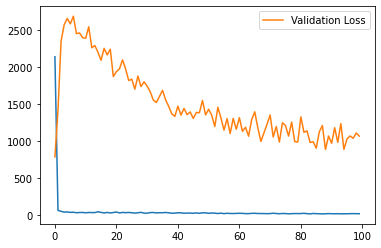

In [423]:
plt.plot(history_nn.history['loss'])
plt.plot(history_nn.history['val_loss'], label = 'Validation Loss')
plt.legend()

In [424]:
ynew_nn_train_no_covid = model_nn.predict(X_train)
ynew_nn_test_no_covid = model_nn.predict(X_test_arr)


2022-12-08 19:00:20.262223: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 19:00:20.562490: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


In [425]:
model_lstm = Sequential()

model_lstm.add(LSTM(128, input_shape=(X_train.shape[1],1), return_sequences=True))
model_lstm.add(Dropout(0.2))
model_lstm.add(BatchNormalization())  #normalizes activation outputs, same reason you want to normalize your input data.

model_lstm.add(LSTM(128, return_sequences=True))
model_lstm.add(Dropout(0.1))
model_lstm.add(BatchNormalization())

model_lstm.add(LSTM(128))
model_lstm.add(Dropout(0.2))
model_lstm.add(BatchNormalization())

model_lstm.add(Dense(32, activation='relu'))
model_lstm.add(Dropout(0.2))

model_lstm.add(Dense(1, activation='relu'))

opt = tf.keras.optimizers.Adam(lr=0.001, decay=1e-6)

# Compile model
model_lstm.compile(
    loss='mean_squared_error',
    optimizer=opt,
    metrics=['mean_squared_error']
)



In [426]:
history1 = model_lstm.fit(
        X_train, y_train,
    batch_size=32,
    epochs=70,
    validation_data=(X_test, y_test),
)



Epoch 1/70


2022-12-08 19:00:21.872835: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 19:00:22.519895: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 19:00:22.711214: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 19:00:22.895594: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 19:00:23.193208: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 19:00:23.510961: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 19:00:23.822202: I tensorflow/core/grappler/optimizers/cust

81/81 [==============================] - ETA: 0s - loss: 5078.1846 - mean_squared_error: 5078.1846

2022-12-08 19:00:31.248651: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 19:00:31.416922: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 19:00:31.551161: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 19:00:31.680393: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


81/81 [==============================] - 12s 105ms/step - loss: 5078.1846 - mean_squared_error: 5078.1846 - val_loss: 1187.8888 - val_mean_squared_error: 1187.8888
Epoch 2/70
81/81 [==============================] - 5s 65ms/step - loss: 2846.5046 - mean_squared_error: 2846.5046 - val_loss: 43.9136 - val_mean_squared_error: 43.9136
Epoch 3/70
81/81 [==============================] - 5s 65ms/step - loss: 1134.0372 - mean_squared_error: 1134.0372 - val_loss: 309.2834 - val_mean_squared_error: 309.2834
Epoch 4/70
81/81 [==============================] - 5s 65ms/step - loss: 956.2455 - mean_squared_error: 956.2455 - val_loss: 387.3318 - val_mean_squared_error: 387.3318
Epoch 5/70
81/81 [==============================] - 5s 64ms/step - loss: 953.9997 - mean_squared_error: 953.9997 - val_loss: 395.0396 - val_mean_squared_error: 395.0396
Epoch 6/70
81/81 [==============================] - 5s 63ms/step - loss: 971.4512 - mean_squared_error: 971.4512 - val_loss: 317.0563 - val_mean_squared_error

81/81 [==============================] - 5s 65ms/step - loss: 43.0823 - mean_squared_error: 43.0823 - val_loss: 124.8757 - val_mean_squared_error: 124.8757
Epoch 50/70
81/81 [==============================] - 5s 65ms/step - loss: 49.9067 - mean_squared_error: 49.9067 - val_loss: 344.8904 - val_mean_squared_error: 344.8904
Epoch 51/70
81/81 [==============================] - 5s 66ms/step - loss: 42.3588 - mean_squared_error: 42.3588 - val_loss: 105.0019 - val_mean_squared_error: 105.0019
Epoch 52/70
81/81 [==============================] - 5s 65ms/step - loss: 45.9779 - mean_squared_error: 45.9779 - val_loss: 243.8462 - val_mean_squared_error: 243.8462
Epoch 53/70
81/81 [==============================] - 5s 66ms/step - loss: 42.6364 - mean_squared_error: 42.6364 - val_loss: 79.9945 - val_mean_squared_error: 79.9945
Epoch 54/70
81/81 [==============================] - 5s 67ms/step - loss: 39.4987 - mean_squared_error: 39.4987 - val_loss: 437.6313 - val_mean_squared_error: 437.6313
Epoch 

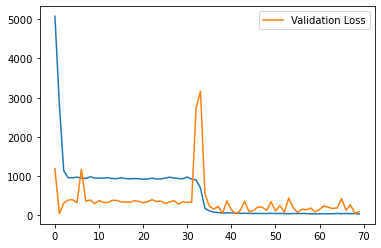

In [433]:
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'], label = 'Validation Loss')
plt.legend()



In [434]:
ynew1_train_no_covid = model_lstm.predict(X_train)
ynew1_test_no_covid = model_lstm.predict(X_test_arr)

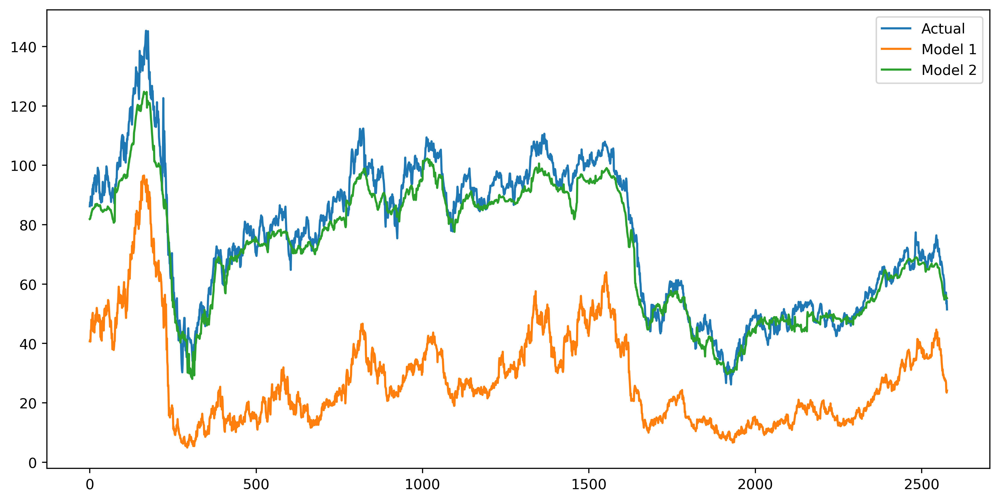

In [435]:
plt.figure(figsize = (12,6), dpi = 400)
plt.plot(y_train, label = 'Actual')
plt.plot(ynew_nn_train_no_covid, label = 'Model 1')
plt.plot(ynew1_train_no_covid, label = 'Model 2')
plt.legend()

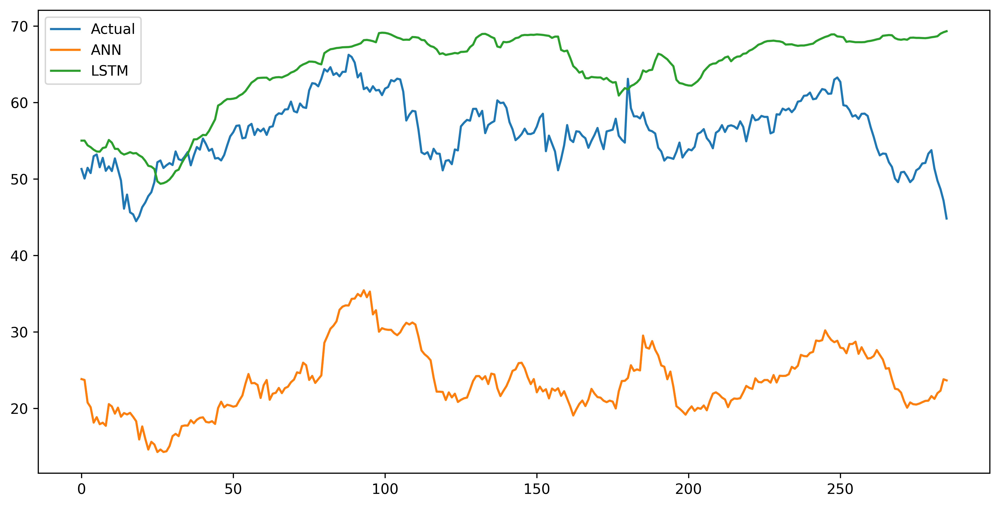

In [438]:

plt.figure(figsize = (12,6), dpi = 600)

plt.plot(y_test, label = 'Actual')
plt.plot(ynew_nn_test_no_covid, label = 'ANN')
plt.plot(ynew1_test_no_covid, label = 'LSTM')
plt.legend()


In [129]:
#ANN Network Training


In [132]:
print(pygad.__version__)

2.18.1


In [150]:
%%timeit

function_inputs = [4, -2, 3.5, 5, -11, -4.7]
desired_output = 44


def fitness_func(solution, solution_idx):
    output = np.sum(solution*function_inputs)
    fitness = 1/(np.square(output - desired_output) + 0.000001)
    return fitness

num_generations = 100
num_parents_mating = 10
sol_per_pop = 20

num_genes = len(function_inputs)

ga_instance = pygad.GA(num_generations = num_generations, num_parents_mating= num_parents_mating, fitness_func= fitness_func, 
                      sol_per_pop=sol_per_pop, num_genes=num_genes)

ga_instance.run()






34.9 ms ± 172 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [152]:
#ANN Trained using LSTM


In [162]:
keras_ga = pygad.kerasga.KerasGA(model = model_nn, num_solutions= 10)


In [163]:
model_nn.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_16 (Dense)            (None, 128)               10496     
                                                                 
 dropout_23 (Dropout)        (None, 128)               0         
                                                                 
 batch_normalization_18 (Bat  (None, 128)              512       
 chNormalization)                                                
                                                                 
 dense_17 (Dense)            (None, 128)               16512     
                                                                 
 dense_18 (Dense)            (None, 128)               16512     
                                                                 
 dense_19 (Dense)            (None, 1)                 129       
                                                      

In [401]:
model_nn = Sequential()
model_nn.add(Dense(64, activation = 'relu',input_shape = (X_train.shape[1],)))
model_nn.add(Dense(64, activation = 'relu'))
model_nn.add(Dense(32, activation = 'relu'))
model_nn.add(Dense(1, activation='relu'))

#model_nn.compile(optimizer=opt,  loss='mean_squared_error', metrics='mean_squared_error')




In [403]:
def fitness_func(solution, solution_idx):
    global X_train_arr, y_train, keras_ga, model_nn
    model_weights_matrix = pygad.kerasga.model_weights_as_matrix(model = model_nn, weights_vector = solution)
    model_nn.set_weights(weights = model_weights_matrix)
    predictions = model_nn.predict(X_train_arr)
    mae = tf.keras.losses.MeanAbsoluteError()
    solution_fitness = 1/(mae(y_train, predictions).numpy() + 0.00001)
    return solution_fitness

weights_vector = pygad.kerasga.model_weights_as_vector(model=model_nn)
keras_ga = pygad.kerasga.KerasGA(model=model_nn,
                                 num_solutions=10 )

def callback_generation(ga_instance):
    print(f'Generation: {ga_instance.generations_completed}')
    print(f'Fitness: {ga_instance.best_solution()[1]}')
    
num_generations = 350
num_parents_mating = 10
initial_population = keras_ga.population_weights
crossover_type = "single_point"
mutation_type = "random"
mutation_percent_genes = 50


ga_instance = pygad.GA(num_generations= num_generations, num_parents_mating=num_parents_mating, 
                       initial_population=initial_population, fitness_func = fitness_func, on_generation= callback_generation,
                       crossover_type=crossover_type, mutation_type=mutation_type, mutation_percent_genes=mutation_percent_genes)

In [404]:
ga_instance.run()

2022-12-08 17:51:37.911042: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Generation: 1
Fitness: 0.016473667592074862
Generation: 2
Fitness: 0.028408315634407665
Generation: 3
Fitness: 0.028408315634407665
Generation: 4
Fitness: 0.028408315634407665
Generation: 5
Fitness: 0.028408315634407665
Generation: 6
Fitness: 0.028408315634407665
Generation: 7
Fitness: 0.028408315634407665
Generation: 8
Fitness: 0.028408315634407665
Generation: 9
Fitness: 0.028408315634407665
Generation: 10
Fitness: 0.028408315634407665
Generation: 11
Fitness: 0.028408315634407665
Generation: 12
Fitness: 0.028408315634407665
Generation: 13
Fitness: 0.028408315634407665
Generation: 14
Fitness: 0.028408315634407665
Generation: 15
Fitness: 0.028408315634407665
Generation: 16
Fitness: 0.028408315634407665
Generation: 17
Fitness: 0.028408315634407665
Generation: 18
Fitness: 0.028408315634407665
Generation: 19
Fitness: 0.028408315634407665
Generation: 20
Fitness: 0.028408315634407665
Generation: 21
Fitness: 0.028408315634407665
Generation: 22
Fitness: 0.028408315634407665
Generation: 23
Fitn

Generation: 182
Fitness: 0.028408315634407665
Generation: 183
Fitness: 0.028408315634407665
Generation: 184
Fitness: 0.028408315634407665
Generation: 185
Fitness: 0.028408315634407665
Generation: 186
Fitness: 0.028408315634407665
Generation: 187
Fitness: 0.028408315634407665
Generation: 188
Fitness: 0.028408315634407665
Generation: 189
Fitness: 0.028408315634407665
Generation: 190
Fitness: 0.028408315634407665
Generation: 191
Fitness: 0.028408315634407665
Generation: 192
Fitness: 0.028408315634407665
Generation: 193
Fitness: 0.028408315634407665
Generation: 194
Fitness: 0.028408315634407665
Generation: 195
Fitness: 0.028408315634407665
Generation: 196
Fitness: 0.028408315634407665
Generation: 197
Fitness: 0.028408315634407665
Generation: 198
Fitness: 0.028408315634407665
Generation: 199
Fitness: 0.028408315634407665
Generation: 200
Fitness: 0.028408315634407665
Generation: 201
Fitness: 0.028408315634407665
Generation: 202
Fitness: 0.028408315634407665
Generation: 203
Fitness: 0.0284083

In [405]:
solution_nn, solution_fitness_nn, solution_idx_nn = ga_instance.best_solution()

best_solution_weights_nn = pygad.kerasga.model_weights_as_matrix(model=model_nn,
                                                              weights_vector=solution_nn)
model_nn.set_weights(best_solution_weights_nn)

In [406]:
filename = 'genetic_ANN'
ga_instance.save(filename=filename)

In [407]:
predictions_ga_ann_test = model_nn.predict(X_test_arr)
#print("Predictions : \n", predictions_ga_ann_test)

predictions_ga_ann_train = model_nn.predict(X_train_arr)
#print("Predictions : \n", predictions_ga_ann_train)

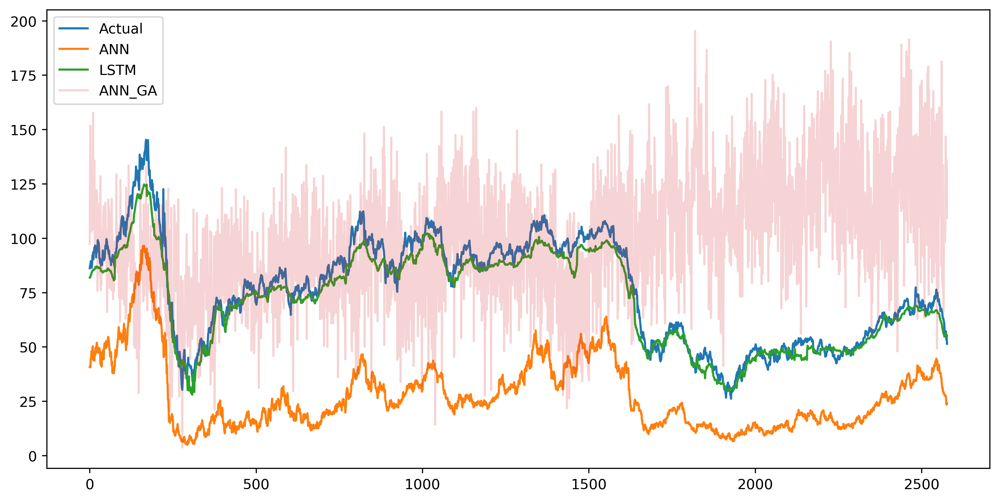

In [439]:
plt.figure(figsize = (12,6), dpi = 400)
plt.plot(y_train, label = 'Actual')
plt.plot(ynew_nn_train_no_covid, label = 'ANN')
plt.plot(ynew1_train_no_covid, label = 'LSTM')
plt.plot(predictions_ga_ann_train, label = 'ANN_GA', alpha = 0.2)
plt.legend()

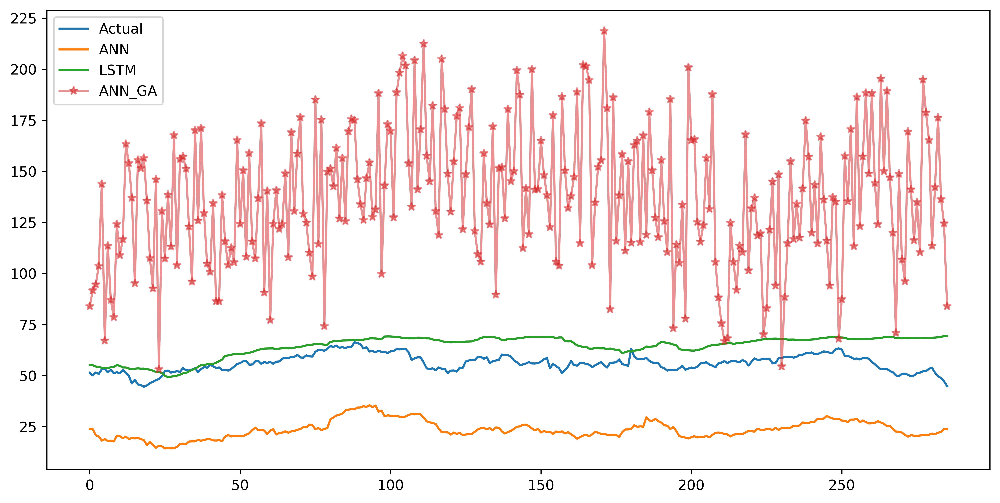

In [440]:
plt.figure(figsize = (12,6), dpi = 600)

plt.plot(y_test, label = 'Actual')
plt.plot(ynew_nn_test_no_covid, label = 'ANN')
plt.plot(ynew1_test_no_covid, label = 'LSTM')
plt.plot(predictions_ga_ann_test, label = 'ANN_GA',  marker = '*', alpha  =  0.5)
plt.legend()


In [410]:
#LSTM GA implementation

In [411]:
model_lstm = Sequential()

model_lstm.add(LSTM(32, input_shape=(X_train.shape[1],1), return_sequences=True))
model_lstm.add(LSTM(32))
#model_lstm.add(Dropout(0.2))
#model_lstm.add(BatchNormalization())  #normalizes activation outputs, same reason you want to normalize your input data.


model_lstm.add(Dense(32, activation='relu'))


model_lstm.add(Dense(1, activation='relu'))

opt = tf.keras.optimizers.Adam(lr=0.001, decay=1e-6)




In [412]:
def fitness_func(solution, solution_idx):
    global X_train_arr, y_train, keras_ga, model_lstm
    model_weights_matrix = pygad.kerasga.model_weights_as_matrix(model = model_lstm, weights_vector = solution)
    model_lstm.set_weights(weights = model_weights_matrix)
    predictions = model_lstm.predict(X_train_arr)
    mse = tf.keras.losses.MeanSquaredError()
    solution_fitness = 1/(mse(y_train, predictions).numpy() + 0.00001)
    return solution_fitness

weights_vector = pygad.kerasga.model_weights_as_vector(model=model_lstm)
keras_ga = pygad.kerasga.KerasGA(model=model_lstm,
                                 num_solutions=10 )

def callback_generation(ga_instance):
    print(f'Generation: {ga_instance.generations_completed}')
    print(f'Fitness: {ga_instance.best_solution()[1]}')
    
num_generations = 100
num_parents_mating = 8
initial_population = keras_ga.population_weights
crossover_type = "single_point"
mutation_type = "random"
mutation_percent_genes = 20


ga_instance = pygad.GA(num_generations= num_generations, num_parents_mating=num_parents_mating, 
                       initial_population=initial_population, fitness_func = fitness_func, on_generation= callback_generation,
                       crossover_type=crossover_type, mutation_type=mutation_type, mutation_percent_genes=mutation_percent_genes
                      )

In [413]:
ga_instance.run()

2022-12-08 18:04:44.065877: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 18:04:44.132712: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.
2022-12-08 18:04:44.269400: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:112] Plugin optimizer for device_type GPU is enabled.


Generation: 1
Fitness: 0.0001723779049291833
Generation: 2
Fitness: 0.0001723779049291833
Generation: 3
Fitness: 0.00018587898716946677
Generation: 4
Fitness: 0.00019052725964102373
Generation: 5
Fitness: 0.00019052725964102373
Generation: 6
Fitness: 0.0002005920988938515
Generation: 7
Fitness: 0.00022988198627600241
Generation: 8
Fitness: 0.00024247653732067695
Generation: 9
Fitness: 0.00027249062075031943
Generation: 10
Fitness: 0.0002776528241974532
Generation: 11
Fitness: 0.0002776528241974532
Generation: 12
Fitness: 0.0003798265357837497
Generation: 13
Fitness: 0.0003798265357837497
Generation: 14
Fitness: 0.0006371002936640985
Generation: 15
Fitness: 0.0006371002936640985
Generation: 16
Fitness: 0.0006371002936640985
Generation: 17
Fitness: 0.0006371002936640985
Generation: 18
Fitness: 0.0007489017818459667
Generation: 19
Fitness: 0.001047445217437366
Generation: 20
Fitness: 0.0013898041755620683
Generation: 21
Fitness: 0.0013898041755620683
Generation: 22
Fitness: 0.001389804175

In [414]:
solution_lstm, solution_fitness_lstm, solution_idx_lstm = ga_instance.best_solution()

best_solution_weights_lstm = pygad.kerasga.model_weights_as_matrix(model=model_lstm,
                                                              weights_vector=solution_lstm)
model_lstm.set_weights(best_solution_weights_lstm)

In [415]:
filename = 'genetic_LSTM'
ga_instance.save(filename=filename)

In [416]:
predictions_ga_lstm_test = model_lstm.predict(X_test_arr)


predictions_ga_lstm_train = model_lstm.predict(X_train_arr)
#print("Predictions : \n", predictions_ga_ann_train)

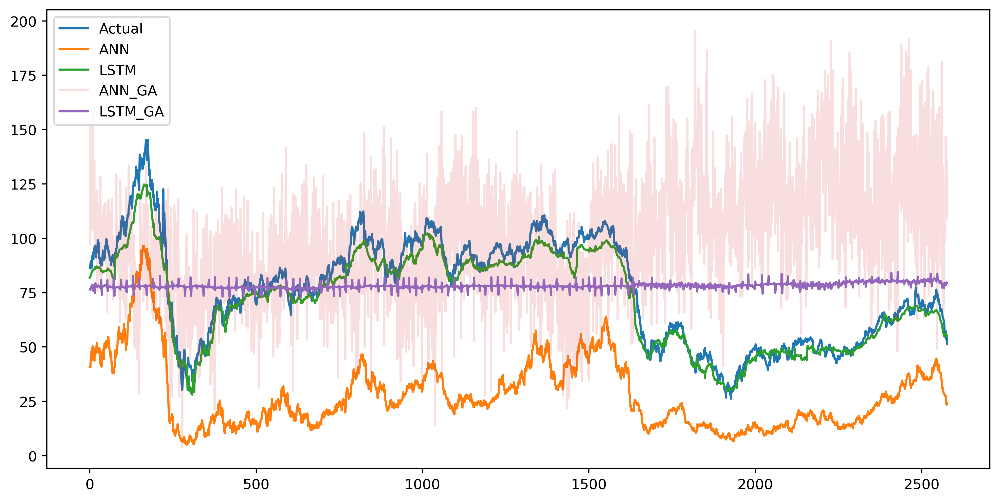

In [441]:
plt.figure(figsize = (12,6), dpi = 400)
plt.plot(y_train, label = 'Actual')
plt.plot(ynew_nn_train_no_covid, label = 'ANN')
plt.plot(ynew1_train_no_covid, label = 'LSTM')
plt.plot(predictions_ga_ann_train, label = 'ANN_GA', alpha = 0.15)
plt.plot(predictions_ga_lstm_train, label = 'LSTM_GA')
plt.legend()

(array([-50.,   0.,  50., 100., 150., 200., 250., 300.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

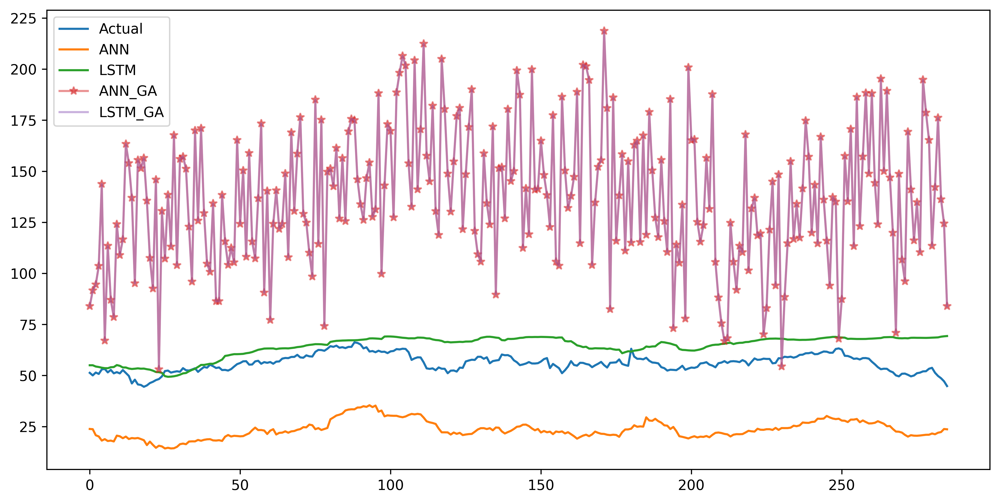

In [450]:
plt.figure(figsize = (12,6), dpi = 600)

plt.plot(y_test, label = 'Actual')
plt.plot(ynew_nn_test_no_covid, label = 'ANN')
plt.plot(ynew1_test_no_covid, label = 'LSTM')
plt.plot(predictions_ga_ann_test, label = 'ANN_GA',  marker = '*', alpha  =  0.5)
plt.plot(predictions_ga_ann_test, label = 'LSTM_GA', alpha  =  0.5)
plt.legend()
plt.xticks()

In [448]:
for i in range(X_train.shape[0]+ X_test.shape[0]):
    

SyntaxError: invalid syntax (1844606714.py, line 1)

In [446]:
X_train

,NASDAQCOM,DEXJPUS,DEXUSEU,DEXCHUS,DEXUSAL,VIXCLS,DCOILWTICO,GOLD,NIFTY50,SNP500,...,22,23,24,25,26,27,28,29,30,31
0,0.177660,0.824509,0.670630,0.991767,0.590551,0.116007,0.443083,0.036713,0.260304,0.323311,...,0,0,0,0,0,0,0,0,0,0
1,0.179594,0.827517,0.659627,0.991564,0.585908,0.097323,0.453660,0.030288,0.284918,0.327950,...,0,0,0,0,0,0,0,0,0,0
2,0.180495,0.831328,0.671162,0.990215,0.589340,0.104992,0.462643,0.040050,0.296526,0.326961,...,0,0,0,0,0,0,0,0,0,0
3,0.175885,0.842158,0.683762,0.990552,0.599637,0.135806,0.477334,0.045891,0.305003,0.323986,...,0,0,0,0,0,0,0,0,0,0
4,0.179801,0.837946,0.673114,0.991227,0.599435,0.119771,0.483042,0.046725,0.295184,0.326714,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,0.737215,0.754112,0.192369,0.591983,0.244094,0.100669,0.298019,0.452691,0.820707,0.788804,...,0,0,0,0,0,0,0,0,0,0
2573,0.718048,0.763137,0.168589,0.617560,0.232788,0.114612,0.285426,0.439341,0.819366,0.776670,...,0,0,0,0,0,0,0,0,0,0
2574,0.693947,0.767148,0.162023,0.617087,0.231577,0.151701,0.247146,0.421402,0.819091,0.754958,...,0,0,0,0,0,0,0,0,0,0
2575,0.686404,0.761733,0.166282,0.613983,0.231375,0.168851,0.251595,0.424656,0.818461,0.747356,...,0,0,0,0,0,0,0,0,0,0


In [454]:
fred_df= pd.read_csv('fred_df.csv', index_col= 'Unnamed: 0')

fred_df.columns = ['DATE', 'NASDAQCOM', 'DEXJPUS', 'DEXUSEU', 'DEXCHUS', 'DEXUSAL',
       'VIXCLS', 'DCOILWTICO', 'GOLD', 'NIFTY50', 'SNP500', 'MONTH',
       'DAY']

cols = ['NASDAQCOM', 'DEXJPUS', 'DEXUSEU', 'DEXCHUS', 'DEXUSAL',
       'VIXCLS', 'GOLD', 'NIFTY50', 'SNP500', 'DCOILWTICO']

fred_df.dropna(inplace = True)

for i in cols:
    col_name_roll = f'{i}_rolling_5'
    col_name_roll1 = f'{i}_rolling_10'
    col_name_roll2 = f'{i}_rolling_15'
    fred_df[col_name_roll] = fred_df[i].rolling(window = ROLLING).mean()
    fred_df[col_name_roll1] = fred_df[i].rolling(window = ROLLING1).mean()
    fred_df[col_name_roll2] = fred_df[i].rolling(window = ROLLING2).mean()
    
months = pd.get_dummies(fred_df['MONTH'], drop_first=True)
months.columns = ['FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC']

day = pd.get_dummies(fred_df['DAY'], drop_first=True)

fred_df = pd.concat([fred_df, months, day], axis = 1)



In [462]:
fred_df = fred_df[fred_df['DATE'] <= '2020-3-1']

In [464]:


fred_df['OIL_PRICE_FUTURE'] = fred_df['DCOILWTICO'].shift(-FUTURE)

del fred_df['DAY']
del fred_df['MONTH']

cols = ['NASDAQCOM',
                     'DEXJPUS',               'DEXUSEU',
                     'DEXCHUS',               'DEXUSAL',
                      'VIXCLS',            'DCOILWTICO',
                        'GOLD',               'NIFTY50',
                      'SNP500',   'NASDAQCOM_rolling_5',
        'NASDAQCOM_rolling_10',  'NASDAQCOM_rolling_15',
           'DEXJPUS_rolling_5',    'DEXJPUS_rolling_10',
          'DEXJPUS_rolling_15',     'DEXUSEU_rolling_5',
          'DEXUSEU_rolling_10',    'DEXUSEU_rolling_15',
           'DEXCHUS_rolling_5',    'DEXCHUS_rolling_10',
          'DEXCHUS_rolling_15',     'DEXUSAL_rolling_5',
          'DEXUSAL_rolling_10',    'DEXUSAL_rolling_15',
            'VIXCLS_rolling_5',     'VIXCLS_rolling_10',
           'VIXCLS_rolling_15',        'GOLD_rolling_5',
             'GOLD_rolling_10',       'GOLD_rolling_15',
           'NIFTY50_rolling_5',    'NIFTY50_rolling_10',
          'NIFTY50_rolling_15',      'SNP500_rolling_5',
           'SNP500_rolling_10',     'SNP500_rolling_15',
        'DCOILWTICO_rolling_5', 'DCOILWTICO_rolling_10',
       'DCOILWTICO_rolling_15']

minmaxscaler = MinMaxScaler()

fred_df[cols] = minmaxscaler.fit_transform(fred_df.loc[:, fred_df.columns.isin(cols)])

fred_df.dropna(inplace = True)


In [526]:
len(y_train)

2577

In [529]:
list(y_train).append(list(y_test))

In [539]:
arr = list(y_train)+ list(y_test)

In [572]:
arr_nn = list(ynew_nn_train_no_covid) + list(ynew_nn_test_no_covid)
arr_lstm = list(ynew1_train_no_covid) + list(ynew1_test_no_covid)
arr_ga_nn = list(predictions_ga_ann_train) + list(predictions_ga_ann_test)
arr_ga_lstm = list(predictions_ga_lstm_train) + list(predictions_ga_lstm_test)

In [573]:
arr_nn1 = []
for x in arr_nn:
    arr_nn1.append(float(x))
    
arr_lstm1 = []
for x in arr_lstm:
    arr_lstm1.append(float(x))
    
arr_ga_nn1 = []
for x in arr_ga_nn:
    arr_ga_nn1.append(float(x))
arr_ga_lstm1 = []
for x in arr_ga_lstm:
    arr_ga_lstm1.append(float(x))

In [576]:
len(arr_lstm1)

2863

In [598]:
len(y_train)

2577

In [577]:
temp = pd.DataFrame(date_arr)

In [578]:
temp['Actual'] = arr

In [579]:
temp['NN'] = arr_nn1
temp['LSTM'] = arr_lstm1
temp['GA_NN'] = arr_ga_nn1
temp['GA_LSTM'] = arr_ga_lstm1


In [612]:
#temp.to_csv('temp.csv')

In [604]:
temp['DATE'][2577]

Timestamp('2018-08-31 00:00:00')

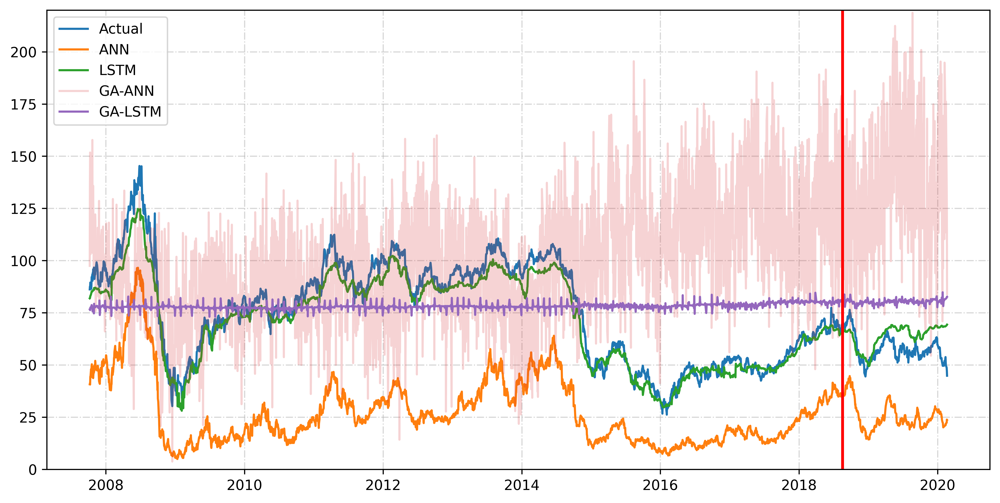

In [620]:
plt.figure(figsize = (12,6), dpi = 600)

plt.plot( temp['DATE'],temp['Actual'], label = 'Actual')
plt.plot( temp['DATE'],temp['NN'], label = 'ANN')
plt.plot( temp['DATE'],temp['LSTM'], label = 'LSTM')
plt.plot( temp['DATE'],temp['GA_NN'], label = 'GA-ANN', alpha = 0.2)
plt.plot( temp['DATE'],temp['GA_LSTM'], label = 'GA-LSTM', alpha = 1)
plt.vlines(x = datetime(2018,8,18), ymin = 0, ymax= 240, color = 'red', linewidth = 2)
#plt.plot(predictions_ga_ann_test, label = 'ANN_GA',  marker = '*', alpha  =  0.5)
#plt.plot(predictions_ga_ann_test, label = 'LSTM_GA', alpha  =  0.5)
plt.legend()
plt.grid(linestyle = '-.', alpha = 0.5)
plt.ylim(0,220)
#plt.savefig('Plot1.jpg', dpi = 800)
plt.show()


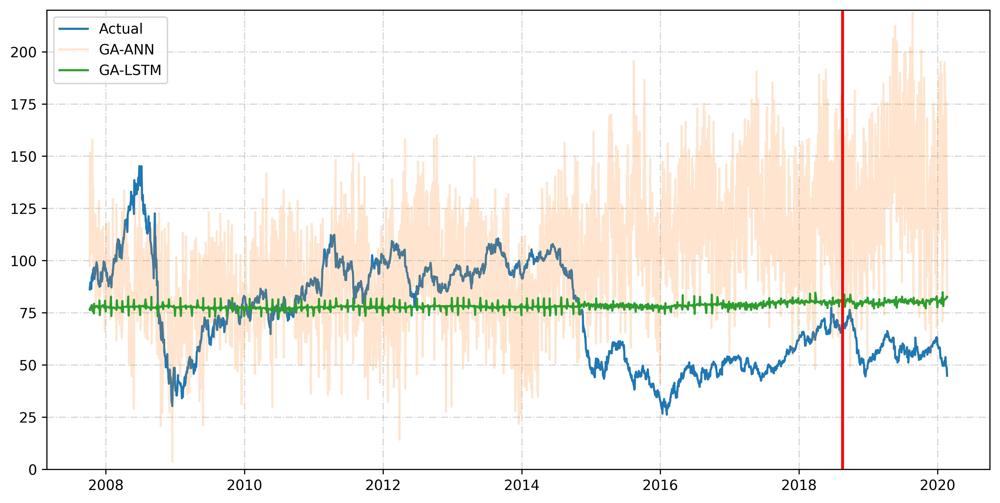

In [621]:
plt.figure(figsize = (12,6), dpi = 600)

plt.plot( temp['DATE'],temp['Actual'], label = 'Actual')
#plt.plot( temp['DATE'],temp['NN'], label = 'ANN')
#plt.plot( temp['DATE'],temp['LSTM'], label = 'LSTM')
plt.plot( temp['DATE'],temp['GA_NN'], label = 'GA-ANN', alpha = 0.2)
plt.plot( temp['DATE'],temp['GA_LSTM'], label = 'GA-LSTM', alpha = 1)
plt.vlines(x = datetime(2018,8,18), ymin = 0, ymax= 240, color = 'red', linewidth = 2)
#plt.plot(predictions_ga_ann_test, label = 'ANN_GA',  marker = '*', alpha  =  0.5)
#plt.plot(predictions_ga_ann_test, label = 'LSTM_GA', alpha  =  0.5)
plt.legend()
plt.grid(linestyle = '-.', alpha = 0.5)
plt.ylim(0,220)
#plt.savefig('Plot2.jpg', dpi = 800)
plt.show()

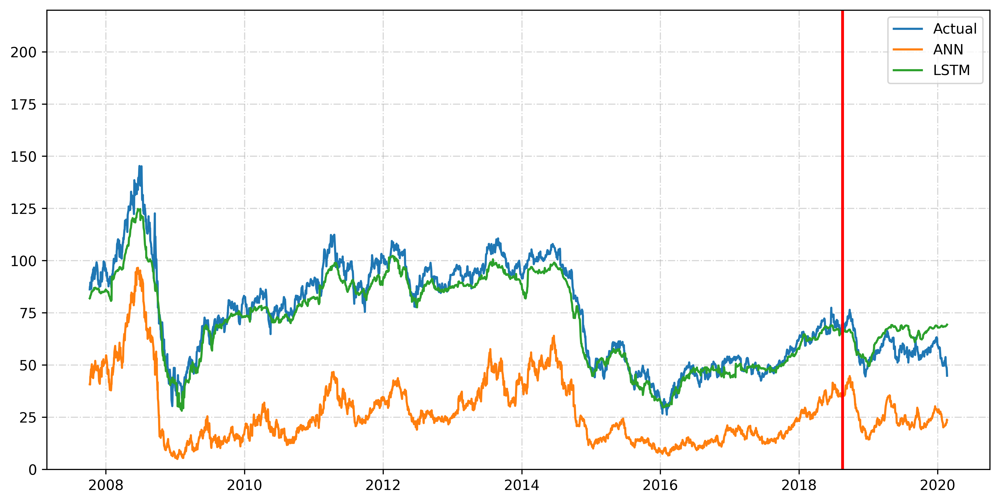

In [622]:
plt.figure(figsize = (12,6), dpi = 600)

plt.plot( temp['DATE'],temp['Actual'], label = 'Actual')
plt.plot( temp['DATE'],temp['NN'], label = 'ANN')
plt.plot( temp['DATE'],temp['LSTM'], label = 'LSTM')
#plt.plot( temp['DATE'],temp['GA_NN'], label = 'GA-ANN', alpha = 0.2)
#plt.plot( temp['DATE'],temp['GA_LSTM'], label = 'GA-LSTM', alpha = 1)
plt.vlines(x = datetime(2018,8,18), ymin = 0, ymax= 240, color = 'red', linewidth = 2)
#plt.plot(predictions_ga_ann_test, label = 'ANN_GA',  marker = '*', alpha  =  0.5)
#plt.plot(predictions_ga_ann_test, label = 'LSTM_GA', alpha  =  0.5)
plt.legend()
plt.grid(linestyle = '-.', alpha = 0.5)
plt.ylim(0,220)
plt.savefig('Plot3.jpg', dpi = 800)
plt.show()

In [654]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

In [629]:
ann_training = mean_squared_error(temp['Actual'][:2577], temp['NN'][:2577])
lstm_training = mean_squared_error(temp['Actual'][:2577], temp['LSTM'][:2577])
ga_ann_training = mean_squared_error(temp['Actual'][:2577], temp['GA_NN'][:2577])
ga_lstm_training = mean_squared_error(temp['Actual'][:2577], temp['GA_LSTM'][:2577])

In [630]:
ga_lstm_training

590.7967152384599

In [631]:
ga_ann_training

2341.6971906865315

In [633]:
lstm_training

40.25686688210681

In [639]:
ann_training

2495.1646536565645

In [640]:
ann_test = mean_squared_error(temp['Actual'][2577:], temp['NN'][2577:])
lstm_test = mean_squared_error(temp['Actual'][2577:], temp['LSTM'][2577:])
ga_ann_test = mean_squared_error(temp['Actual'][2577:], temp['GA_NN'][2577:])
ga_lstm_test = mean_squared_error(temp['Actual'][2577:], temp['GA_LSTM'][2577:])

In [641]:
ann_test

1071.1754678411933

In [642]:
ann_training

2495.1646536565645

In [643]:
ga_ann_test

7631.288337675727

In [644]:
ga_lstm_test

602.2008274671557

In [645]:
ann_training1 = mean_absolute_error(temp['Actual'][:2577], temp['NN'][:2577])
lstm_training1 = mean_absolute_error(temp['Actual'][:2577], temp['LSTM'][:2577])
ga_ann_training1 = mean_absolute_error(temp['Actual'][:2577], temp['GA_NN'][:2577])
ga_lstm_training1 = mean_absolute_error(temp['Actual'][:2577], temp['GA_LSTM'][:2577])

ann_test1 = mean_absolute_error(temp['Actual'][2577:], temp['NN'][2577:])
lstm_test1 = mean_absolute_error(temp['Actual'][2577:], temp['LSTM'][2577:])
ga_ann_test1 = mean_absolute_error(temp['Actual'][2577:], temp['GA_NN'][2577:])
ga_lstm_test1 = mean_absolute_error(temp['Actual'][2577:], temp['GA_LSTM'][2577:])

In [646]:
print(ann_training1)

48.07990701017428


In [647]:
print(lstm_training1)

5.096282185268439


In [648]:
print(ga_ann_training1)

37.83653260459352


In [649]:
print(ga_lstm_training1)

21.046912748005948


In [650]:
print(ann_test1)

32.571596057064895


In [651]:
print(lstm_test1)

8.285258368111991


In [652]:
print(ga_ann_test1)

80.83341812720664


In [658]:
print(ga_lstm_test1)

24.15873193594126


In [655]:
ann_training2 = mean_absolute_percentage_error(temp['Actual'][:2577], temp['NN'][:2577])
lstm_training2 = mean_absolute_percentage_error(temp['Actual'][:2577], temp['LSTM'][:2577])
ga_ann_training2 = mean_absolute_percentage_error(temp['Actual'][:2577], temp['GA_NN'][:2577])
ga_lstm_training2 = mean_absolute_percentage_error(temp['Actual'][:2577], temp['GA_LSTM'][:2577])

ann_test2 = mean_absolute_percentage_error(temp['Actual'][2577:], temp['NN'][2577:])
lstm_test2 = mean_absolute_percentage_error(temp['Actual'][2577:], temp['LSTM'][2577:])
ga_ann_test2 = mean_absolute_percentage_error(temp['Actual'][2577:], temp['GA_NN'][2577:])
ga_lstm_test2 = mean_absolute_percentage_error(temp['Actual'][2577:], temp['GA_LSTM'][2577:])

In [656]:
print(ann_training2)

0.6521149341927295


In [657]:
print(lstm_training2)

0.06604650064386207


In [659]:
print(ga_ann_training2)

0.6535313708592368


In [660]:
print(ga_lstm_training2)

0.33932325551203324


In [661]:
print(ann_test2)

0.5823109981230512


In [662]:
print(lstm_test2)

0.15066860282233266


In [663]:
print(ga_ann_test2)

1.4486507287368866


In [664]:
print(ga_lstm_test2)

0.4389428168841175
